In [3]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio

## Version:1 Estimation on Sine wave using Random Normal Noise

c:\python\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\python\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


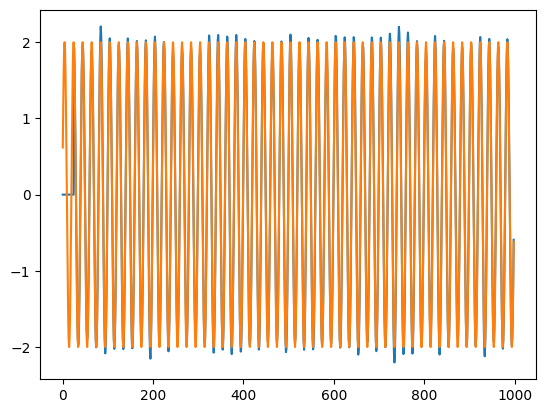

In [2]:
t = np.arange(0.001, 1, 0.001)
D = 2 * np.sin(2 * np.pi * 50 * t)
A = D + 0.9 * np.random.random(len(D))
M = 25
n = len(D)
w = np.zeros(M, complex)
wi = np.zeros(M, complex)
E = np.zeros(n - M, complex)
mu = 0.0005

for i in range(M, n):
    x = np.flip(A[i - M + 1:i + 1])  # Extract the window of input samples
    E[i - M] = D[i] - np.dot(wi, np.conj(x))
    wi = wi + 2 * mu * E[i - M] * np.conj(x)

Est = np.zeros(n, complex)
for i in range(M, n):
    j = np.flip(A[i - M + 1:i + 1])
    Est[i] = np.dot(wi, np.conj(j))

err = np.conj(Est[M:]) - D[M:]

plt.plot(Est)
plt.plot(D)


## Version:2 Adding random gaussian noise in audio signal

In [4]:
desired_audio, sr =librosa.load('desired.wav',sr = 44100)
N= len(desired_audio)
noise = np.random.normal(0, 1, N)
audio_with_noise = np.zeros(N)
for i in range(N):
    audio_with_noise[i] = desired_audio[i]+noise[i]
# Ensure both audio signals have the same length
min_len = min(len(desired_audio), len(audio_with_noise))
desired_audio = desired_audio[:min_len]
noise_audio = audio_with_noise[:min_len]

# Convert audio to complex data type
desired_audio = desired_audio.astype(complex)
noise_audio = noise_audio.astype(complex)

# Active noise cancellation
M = 25  # Filter length
mu = 0.0005  # Step size
n = len(desired_audio)
w = np.zeros(M, dtype=complex)
wi = np.zeros(M, dtype=complex)
E = np.zeros(n - M, dtype=complex)

for i in range(M, n):
    x = np.flip(noise_audio[i - M + 1:i + 1])  # Extract the window of noise samples
    E[i - M] = desired_audio[i] - np.dot(wi, np.conj(x))
    wi = wi + 2 * mu * E[i - M] * np.conj(x)

# Apply active noise cancellation
output_audio = np.zeros_like(desired_audio)
for i in range(M, n):
    x = np.flip(noise_audio[i - M + 1:i + 1])
    output_audio[i] = desired_audio[i] - np.dot(wi, np.conj(x))

# Save or play the output audio
Audio(data=audio_with_noise, rate=sr)

In [5]:
Audio(data= output_audio, rate=sr)

C:\Users\Anurag\AppData\Roaming\Python\Python311\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


## Version:3 Real time noise canellation using two streams

In [6]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
import pyaudio

FORMAT = pyaudio.paFloat32
CHANNELS = 1
CHUNK_SIZE = 1024

p = pyaudio.PyAudio()

# Open streams for input and playback (modified)
stream_in = p.open(format=FORMAT,
                   channels=CHANNELS,
                   rate=44100,
                   input=True,
                   frames_per_buffer=CHUNK_SIZE)
#For Duplex
# stream_in = p.open(format=FORMAT,
#                    channels=CHANNELS,
#                    rate=44100,
#                    input=True,
#                      output = true,
#                    frames_per_buffer=CHUNK_SIZE)

stream_out = p.open(format=FORMAT,
                    channels=CHANNELS,
                    rate=44100,
                    output=True,
                    frames_per_buffer=CHUNK_SIZE)

# Load desired audio
desired_audio, sr = librosa.load('desired.wav', sr=44100)

# Initialize adaptive filter parameters
M = 25  # Filter length
mu = 0.0005  # Step size
w = np.zeros(M)
empty_array = np.array([])

try:
    print("Performing active noise cancellation... Press Ctrl+C to stop.")
    while True:
        # Read audio data from the microphone
        data_in = stream_in.read(CHUNK_SIZE)
        data_array = np.frombuffer(data_in, dtype=np.float32)
        empty_array = np.append(empty_array, data_array)
        stream_out.write(data_in)

except KeyboardInterrupt:
    print("Stopping active noise cancellation.")
finally:
    # Close streams
   
    stream_in.stop_stream()
    stream_in.close()
    stream_out.stop_stream()
    stream_out.close()

    p.terminate()

Performing active noise cancellation... Press Ctrl+C to stop.
Stopping active noise cancellation.


## Version:4 Taking ambient noise in real time and post processing

In [5]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
import pyaudio

FORMAT = pyaudio.paFloat32
CHANNELS = 1
CHUNK_SIZE = 1024

p = pyaudio.PyAudio()

# Open streams for input and playback (modified)
stream_in = p.open(format=FORMAT,
                   channels=CHANNELS,
                   rate=44100,
                   input=True,
                   frames_per_buffer=CHUNK_SIZE)
# stream_out = p.open(format=FORMAT,
#                     channels=CHANNELS,
#                     rate=44100,
                    
#                     output=True,
#                     frames_per_buffer=CHUNK_SIZE)

# Load desired audio
desired_audio, sr = librosa.load('desired.wav', sr=44100)

# Initialize adaptive filter parameters
M = 25  # Filter length
mu = 0.0005  # Step size
w = np.zeros(M)
empty_array = np.array([])

try:
    print("Performing active noise cancellation... Press Ctrl+C to stop.")
    while True:
        # Read audio data from the microphone
        data_in = stream_in.read(CHUNK_SIZE)
        data_array = np.frombuffer(data_in, dtype=np.float32)
        empty_array = np.append(empty_array, data_array)


except KeyboardInterrupt:
    print("Stopping active noise cancellation.")
finally:
    # Close streams
   
    stream_in.stop_stream()
    stream_in.close()

    p.terminate()

a = min(len(desired_audio),len(empty_array))
combined_audio = desired_audio[:a] + empty_array[:a]
output_audio_chunk = np.zeros_like(combined_audio)

for i in range(M, len(combined_audio)):
    x = np.flip(combined_audio[i - M:i])
    y = np.dot(w, x)
    e = desired_audio[i] - y  # Error signal
    w = w + mu * e * x  # Update filter coefficients
    output_audio_chunk[i] = desired_audio[i] - y


Performing active noise cancellation... Press Ctrl+C to stop.
Stopping active noise cancellation.


In [6]:
Audio(data=combined_audio,rate=sr)

In [7]:
Audio(data=output_audio_chunk,rate=sr)

In [8]:

def calculate_snr(signal, noise):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

# Assuming desired_audio and output_audio_chunk are numpy arrays

# Calculate SNR for original desired audio
snr_desired_audio = calculate_snr(desired_audio, empty_array[:len(desired_audio)])

# Calculate SNR for processed output audio
snr_output_audio = calculate_snr(desired_audio, output_audio_chunk)

print("SNR of original desired audio:", snr_desired_audio, "dB")
print("SNR of processed output audio:", snr_output_audio, "dB")

SNR of original desired audio: 24.86450936642521 dB
SNR of processed output audio: 11.737281228805257 dB


In [ ]:
#failed due to delay in processing

FORMAT = pyaudio.paInt16
CHANNELS = 1
CHUNK_SIZE = 1024

p = pyaudio.PyAudio()
stream_in = p.open(format=FORMAT,
                    channels=CHANNELS,
                    rate=44100,
                    input=True,
                    frames_per_buffer=CHUNK_SIZE)
# Load desired audio
desired_audio, sr = librosa.load('desired.wav', sr=44100)

# Initialize adaptive filter parameters
M = 25  # Filter length
mu = 0.0005  # Step size
w = np.zeros(M)
empty_array = np.array([])
output_audio_chunk = np.array([])
try:
    print("Performing active noise cancellation... Press Ctrl+C to stop.")
    while True:
        # Read audio data from the microphone
        data_in = stream_in.read(CHUNK_SIZE)
        noise = np.frombuffer(data_in, dtype=np.int16)
        

        #Combine noise with desired audio
        combined_audio = desired_audio[:len(noise)] + noise
        
        

        # Active noise cancellation using LMS algorithm
        output_audio_chunk = np.zeros_like(combined_audio)
        for i in range(M, len(combined_audio)):
                x = np.flip(combined_audio[i - M:i])
                y = np.dot(w, x)
                e = desired_audio[i] - y  # Error signal
                w = w + mu * e * x  # Update filter coefficients
                output_audio_chunk = desired_audio[i] - y
                empty_array = np.append(empty_array, output_audio_chunk)


        # Play processed audio
      
       

except KeyboardInterrupt:
    print("Stopping active noise cancellation.")
finally:
    # Close streams
    stream_in.stop_stream()
    stream_in.close()
    p.terminate()
